In [87]:
#Objective: To practices different image operations.

In [391]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [10]:
# open an image with CV2
image = cv2.imread("cow.PNG")
type(image)

numpy.ndarray

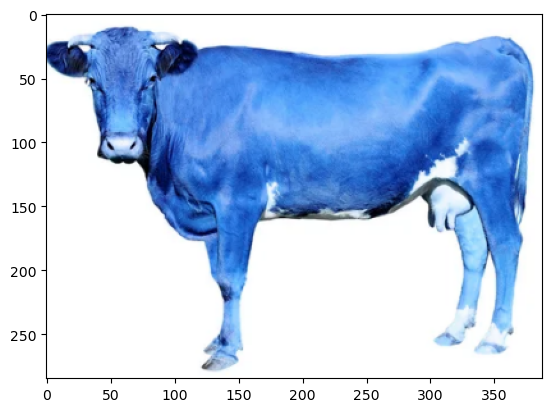

In [11]:
#display an image with matplotlib
plt.imshow(image)

In [12]:
# The order of colors in Opencv is BGR. This why the puppy looks blueish
#On the other hand, the order of colors in matplotlib is RBG
#This means that we need to change the image's color order for CV2
#Apart from these default colors, some applications require that we convert color images to grayscale. This is because only
#information about edges and shapes is required
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
image.shape # 3 represents the color channels

(285, 388, 3)

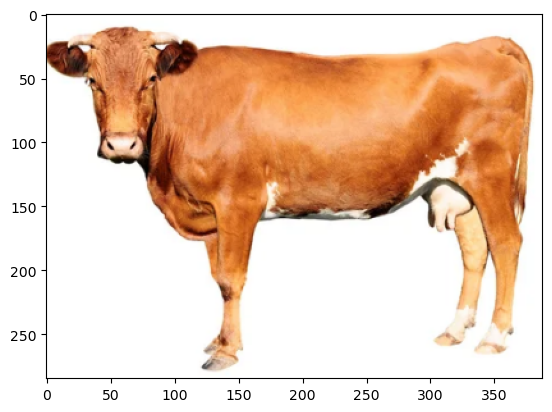

In [13]:
#display the image again 
plt.imshow(image)

In [14]:
#change the image to grayscale image
image_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
image_gray.shape #a grayscale image has 1 color channel

(285, 388)

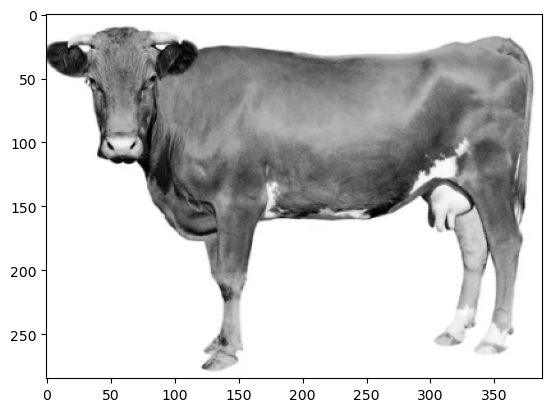

In [15]:
#display the grayscale image
plt.imshow(image_gray, cmap="gray") 

In [16]:
#Displaying an image with opencv
cv2.imshow("cow",image)
cv2.waitKey()
#The image opens down in the bar

-1

Image Operations

In [17]:
image_flipped = cv2.flip(image_gray,0) # This flips the image. Try -1 in place of 0.

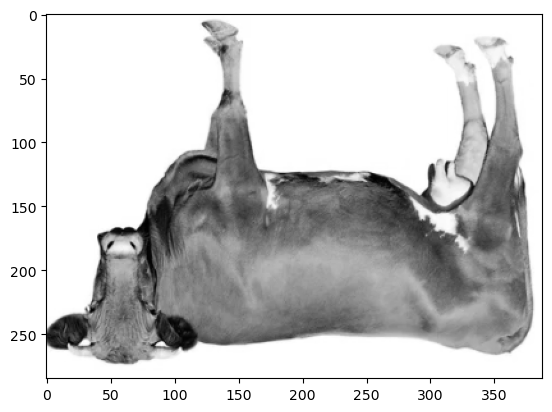

In [18]:
plt.imshow(image_flipped, cmap="gray")

In [19]:
#You can resize the image
resized_image = cv2.resize(image_gray,(150,200))

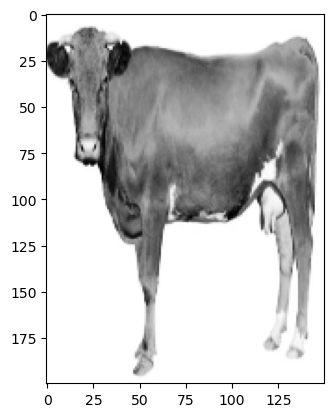

In [20]:
plt.imshow(resized_image, cmap="gray")

In [21]:
width_ratio = 0.4
height_ratio = 0.3
resized_image = cv2.resize(image_gray,(0,0),image_gray,width_ratio,height_ratio)

# The image is reduced to 40% width and 30% height. Please note how blurry it is.

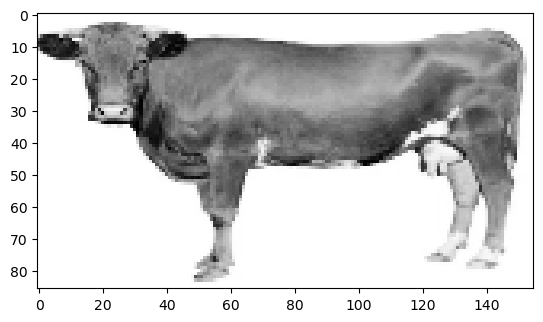

In [22]:
plt.imshow(resized_image, cmap="gray")

In [23]:
# check the file type
type(image)

numpy.ndarray

In [24]:
type(image_gray)

numpy.ndarray

In [25]:
#save the resized_image
cv2.imwrite("resized.png", resized_image)

True

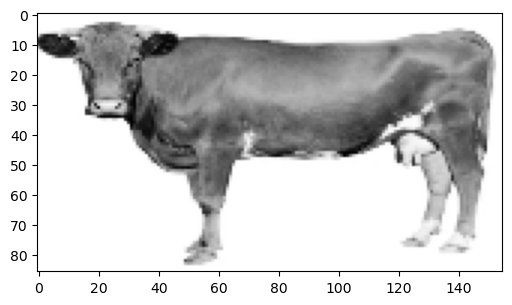

In [26]:
#You can adjust the figure to occupy a sizeable space of your notebook
fig = plt.figure(figsize=(6,8))# creates aspace of size(6 by 8 inches). You can easily adjust this space
ax = fig.add_subplot(111) 
ax.imshow(resized_image,cmap="gray")
#The subplot grid parameters encoded as a single integer. For example, "111" means "1x1 grid, first subplot" and "234" means "2x3 grid, 4th subplot".


1. Image Thresholding

In [116]:
#Thresholding segments images into different parts. It converts an image into black and white (only two values) and this is
#because some applications require binary images to only show general shapes.
rainbow1 = cv2.imread("rainbow1.JPG",cv2.IMREAD_GRAYSCALE)

In [121]:
rainbow1

array([[107, 107, 107, ..., 169, 170, 171],
       [103, 103, 103, ..., 169, 170, 171],
       [103, 103, 103, ..., 169, 170, 171],
       ...,
       [115, 115, 115, ...,  88,  89,  91],
       [116, 116, 116, ...,  89,  91,  93],
       [118, 118, 118, ...,  93,  94,  96]], dtype=uint8)

In [122]:
rainbow1.min(), rainbow1.max()# the minimum value in rainbow1 is 87 while the maximum is 214 (usually, this is 255)

(87, 214)

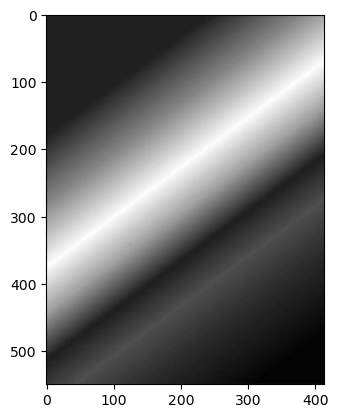

In [117]:
plt.imshow(rainbow1, cmap="gray")

In [129]:
ret,thresholded = cv2.threshold(rainbow1,128,255,cv2.THRESH_BINARY) # Sets rainbow values below 128 to zero, otherwise one with 255 being the maximum
#Shortcuts: You can press Shift Key + Tab to read details of the function and Tab for selection and auto complete

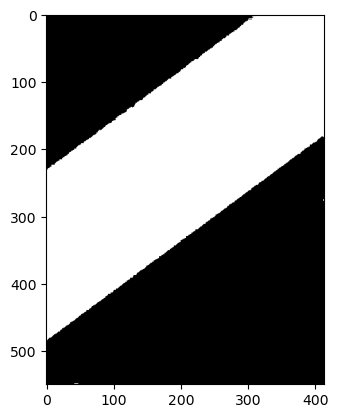

In [131]:
plt.imshow(thresholded,cmap="gray")

In [ ]:
#The above thresholding is one of the simple thresholding, completely segmenting black and white sections of the image.
# Comparing images rainbow1 and rainbow2, images were taken in different lighting conditions.Simple thresholding methods 
#may not work well due to different lighting conditions

In [132]:
rainbow2 = cv2.imread("rainbow2.PNG",cv2.IMREAD_GRAYSCALE)

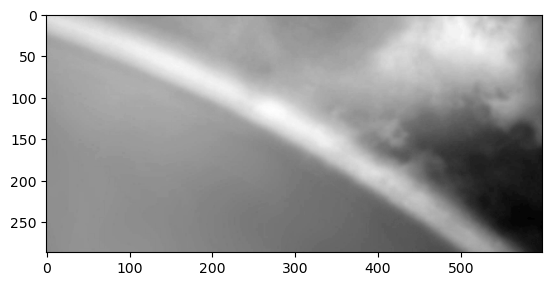

In [135]:
plt.imshow(rainbow2,cmap="gray")

In [136]:
rainbow2

array([[185, 184, 184, ..., 123, 123, 123],
       [186, 186, 186, ..., 120, 123, 123],
       [186, 186, 186, ..., 122, 123, 123],
       ...,
       [131, 132, 133, ...,  56,  56,  56],
       [131, 132, 133, ...,  56,  56,  56],
       [132, 132, 133, ...,  59,  56,  56]], dtype=uint8)

In [140]:
ret,thresholded = cv2.threshold(rainbow2,128,255,cv2.THRESH_BINARY) 


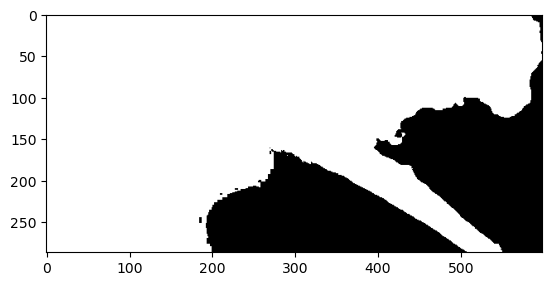

In [141]:
plt.imshow(thresholded,cmap="gray") # The image below is a binary image, values are either 0 or 1 / 0 or 255

In [ ]:
# Please explore the following documentation to find out and try different types of thresholding 
#https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

2. Smoothing, Blurring, Edge detection, Kernels operation


In [ ]:
#Smoothing helps to remove noise from the image. This operation helps to focus on general image details. 

In [171]:
#Nowinstead of writing a code each time we want to read and convert an image to RGB using opencv, lets write a function
def imload():
    image = cv2.imread("bricks.jpg").astype(np.float32)/255 # image is bricks. We are deviding by 255 to normalise an image
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
    return image

In [172]:
#We can also put the code that we last used (see above) to display a cow to create a display function
def imdisplay(image):
    fig = plt.figure(figsize=(10,8))# creates aspace of size(6 by 8 inches). You can easily adjust this space
    ax = fig.add_subplot(111)
    ax.imshow(image)

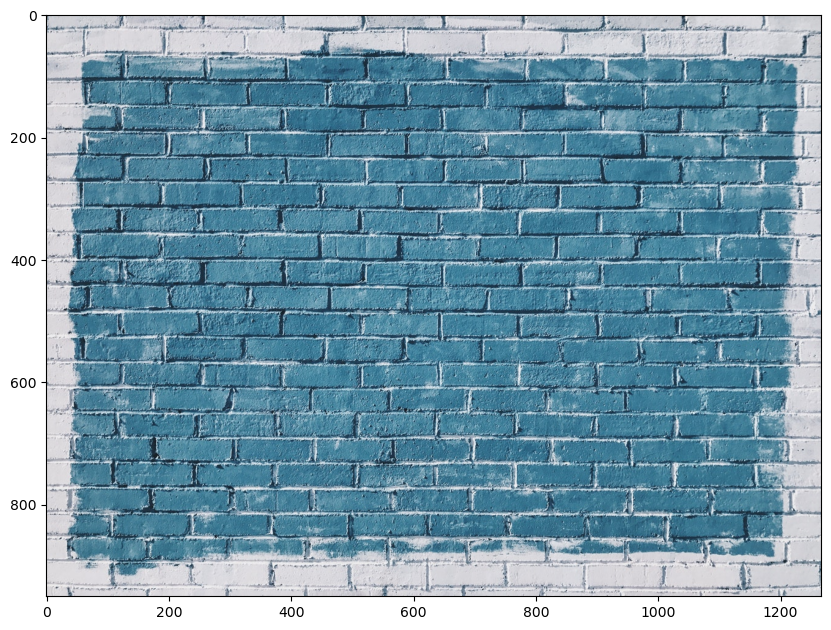

In [175]:
bricks = imload()
imdisplay(bricks)

In [ ]:
#Blurring: To improve visual perception, gamma valuhelps to increase or decrease brightness perception in an image.
#https://www.benq.com/en-in/knowledge-center/knowledge/gamma-monitor.html#:~:text=Gamma%20can%20be%20described%20as,or%20from%20white%20to%20black.

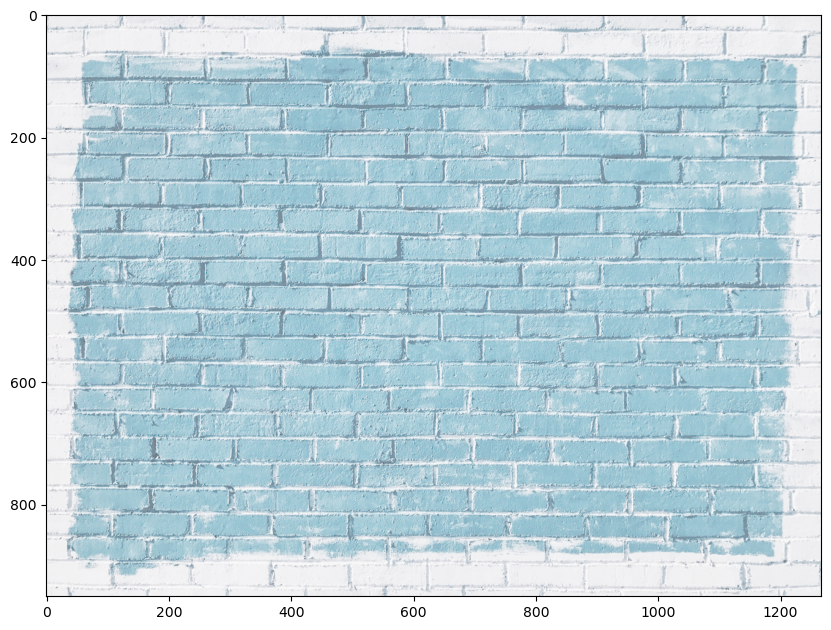

In [180]:
#Low gamma values make an image appear brighter.
gamma = 1/3
gamma_blurred_image = np.power(bricks,gamma)# This takes pixel values and raise the to the power of gamma value. The `raise to power' operator is also known as gamma correction. In this case, the operator is used to correct for the non-linear response of a photographic film
imdisplay(gamma_blurred_image)
# The resource for details about gamma correction: https://homepages.inf.ed.ac.uk/rbf/HIPR2/pixexp.htm#:~:text=A%20typical%20value%20for%20gamma,the%20corrected%20image%20becomes%20linear.

In [181]:
# In the above image, experiment different values of gamma. You should see the image appearing darker for gamma values  greater than 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


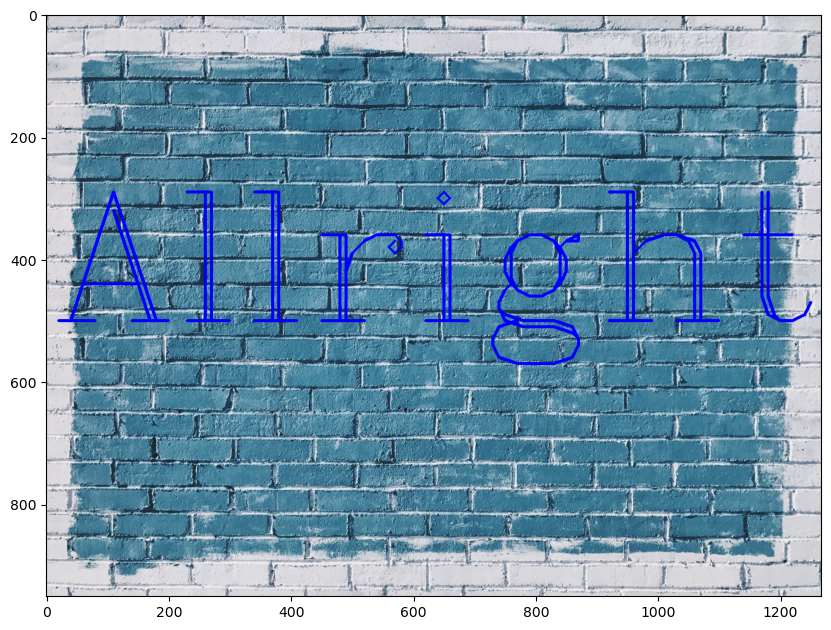

In [226]:
#Let's add a text in th bricks image
bricks = imload()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(bricks,text='Allright',org=(10,500),fontFace=font,fontScale=10,color=(0, 0, 255),thickness=3)
imdisplay(bricks)


In [262]:
#There is space within letters in the image above.
#We can createa kernel and apply it to the image to observe effects it makes
kernel = np.ones(shape=(3,5),dtype=np.float32)/25 #Change the filter size to observe the effects it makes on the words written in the image

In [263]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [266]:
#Apply the filter on the entire image
bricks_filtered = cv2.filter2D(bricks,-1,kernel)
# Read the follwing document about filter2D desired depth (ddepth)
#https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04
#https://stackoverflow.com/questions/43392956/explanation-for-ddepth-parameter-in-cv2-filter2d-opencv

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


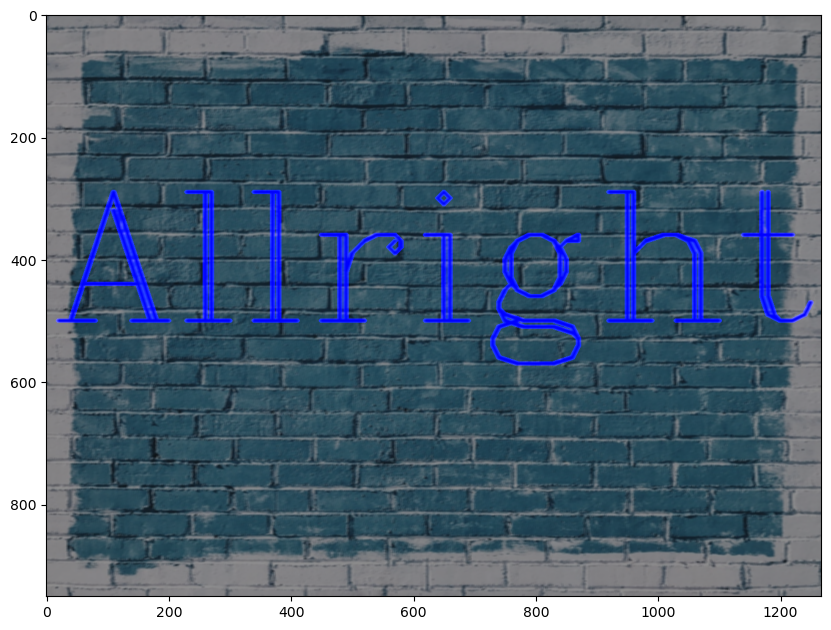

In [267]:
imdisplay(bricks_filtered)

In [268]:
#What effects has the filter made? Observe that gaps between letters have closed!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


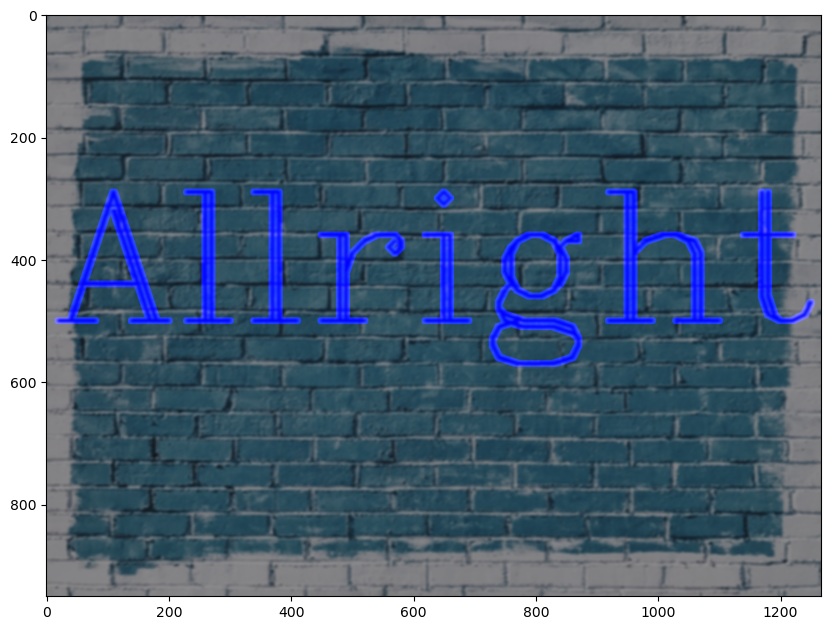

In [275]:
bricks_filtered_blur = cv2.blur(bricks_filtered,(5,5))
imdisplay(bricks_filtered_blur)

In [276]:
#In the image above, you can see gaps between letters closing as a result of filter bluring.
#Please change the blurring kernel size to observe its effects on the image
#You will observe that the bigger the blurring kernel size, the more the gaps close as a result of high pass filtering.
#Also try Gausian blur and median blur

3. Noise

In [302]:
# open an image with CV2
noisy = cv2.imread("noise.PNG")

In [303]:
noisy = cv2.cvtColor(noisy,cv2.COLOR_BGR2RGB)   

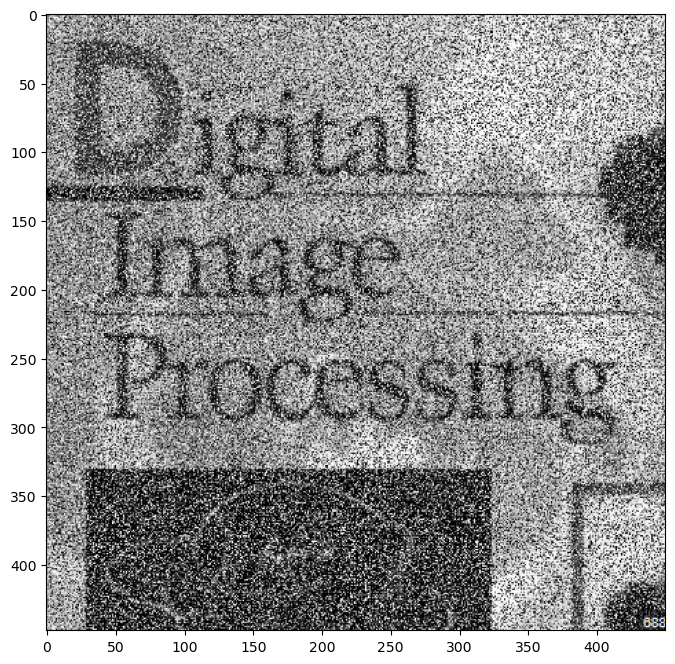

In [305]:
imdisplay(noisy)

In [307]:
median = cv2.medianBlur(noisy,5)

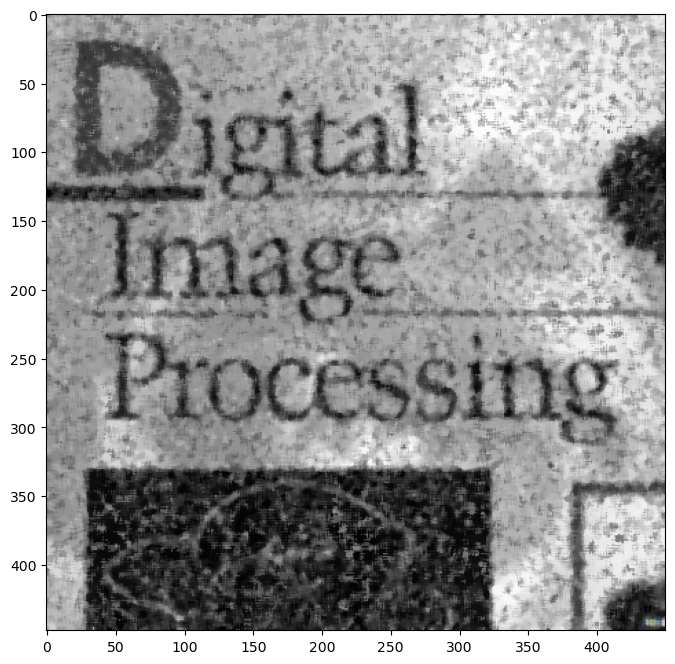

In [308]:
imdisplay(median)

In [311]:
#In the image above, the effect if a medianBlur filter is a more clear image


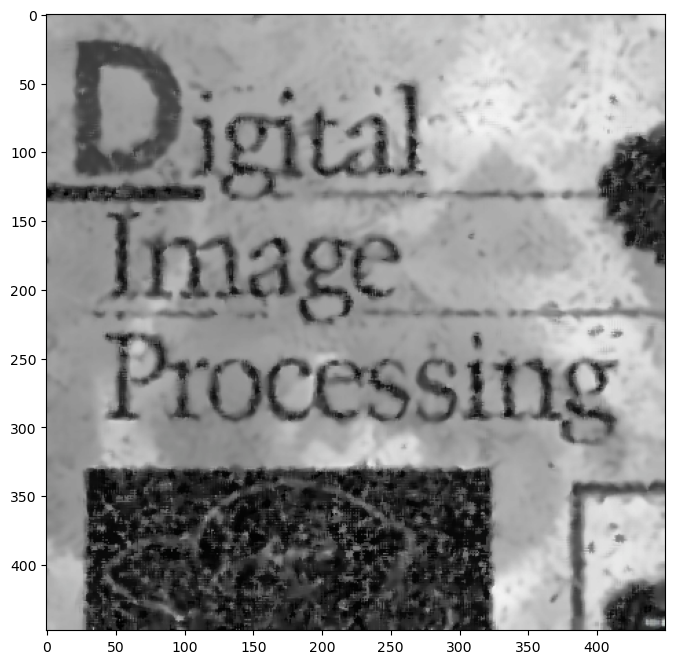

In [314]:
#We can further denoise the image. Non-local Means Denoising algorithm to remove noise in the image from grayscale images.
#https://docs.opencv.org/3.4/d5/d69/tutorial_py_non_local_means.html
destination = cv2.fastNlMeansDenoisingColored(median,None,10,10,7,21)
imdisplay(destination)

In [315]:
# We can further denoise the image. Try different filters and image denoising techniques. You can get resourse from opencv 
#https://learnopencv.com/image-filtering-using-convolution-in-opencv/

4. Gradients and edge detection

In [316]:
#The change in the intensity or colour in an image are very useful in computer vision. An image gradient is a direction of change
#either in intensity or color of an image. Directional changed and the magnitude of this change are useful for algorithms to see
#features and objects in an image
#Let's try use of Sobel operator

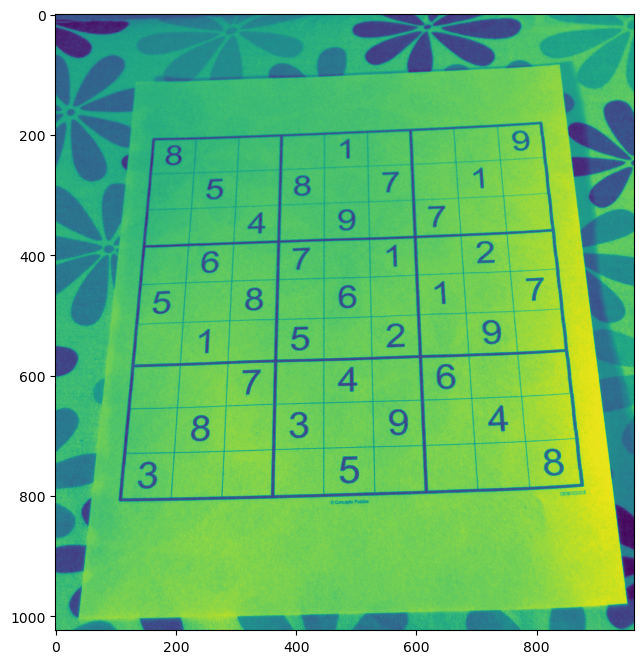

In [357]:
#Let's use sudoku image. In the image, the grid pattern shows clear lines for horizontal and vertical gradients
img_sudoku = cv2.imread("sudoku.jpg",0)#The parameter 0 means the image is read in grayscale

imdisplay(img_sudoku)


In [363]:
#Let's determine horizontal gradient
sobel_x = cv2.Sobel(img_sudoku,ddepth=cv2.CV_64F,dx=1,dy=0,ksize=5)

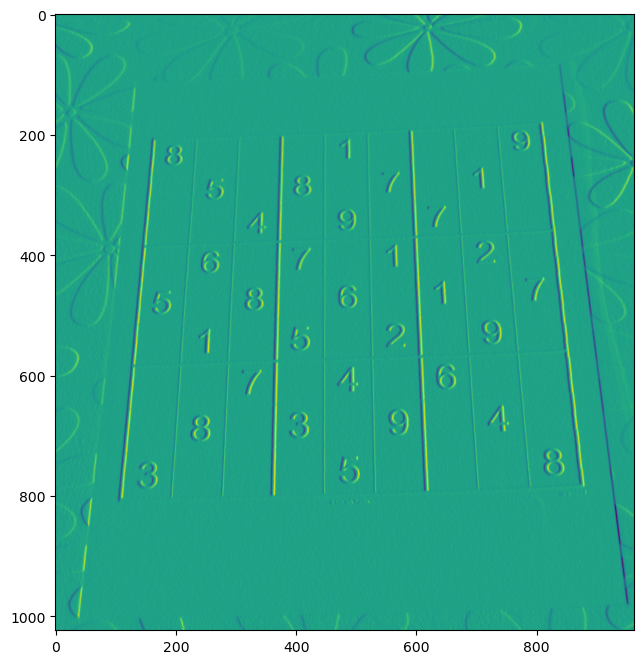

In [364]:
imdisplay(sobel_x_dir)

In [362]:
#The above image shows vertical lines clearly, with horizontal lines hardily visibly
#Let's find vertical gradient

In [365]:
sobel_y = cv2.Sobel(img_sudoku,ddepth=cv2.CV_64F,dx=0,dy=1,ksize=5)

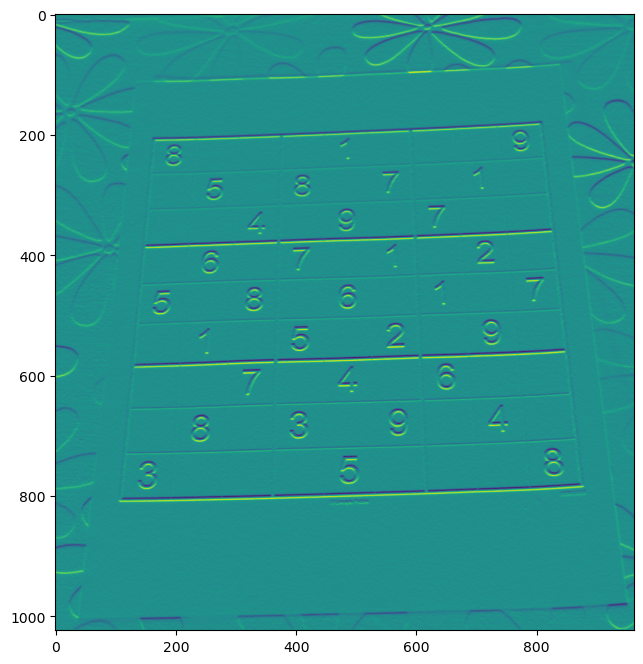

In [366]:
imdisplay(sobel_y)

In [367]:
#For 2D image, we can use laplacian operator to determine the derivatives in x and y directions. Details of laplacian operator:
#https://en.wikipedia.org/wiki/Laplace_operator


In [368]:
Laplacian = cv2.Laplacian(img_sudoku,ddepth=cv2.CV_64F)

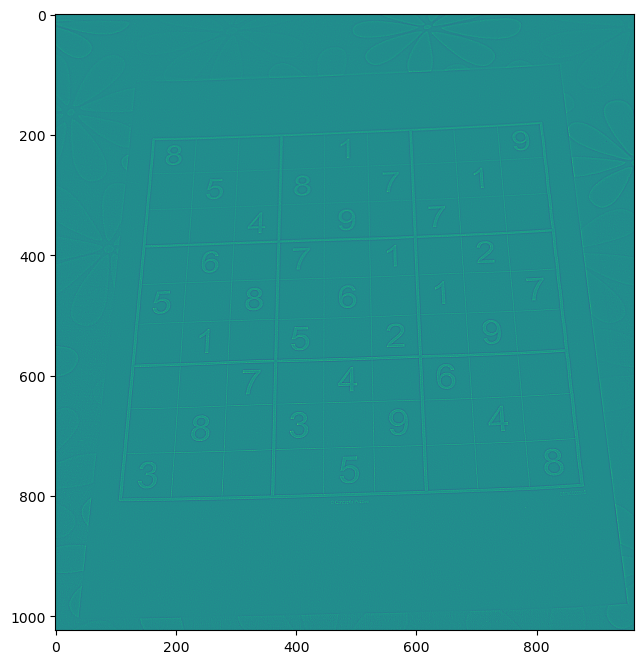

In [369]:
imdisplay(Laplacian)

In [370]:
#The result of laplactian is detection of both vertical and horizontal edges.
#Since the result of laplacian does not look great compared separate sobel_x and sobel_y gradients, we can blend sobel_x and sobel_y

In [375]:
#Calculating the weighted sum of sobel_x and sobel_y arrays
blended_sobel_derivatives = cv2.addWeighted(src1=sobel_x,alpha=0.6,src2=sobel_y,beta=0.6,gamma=0)

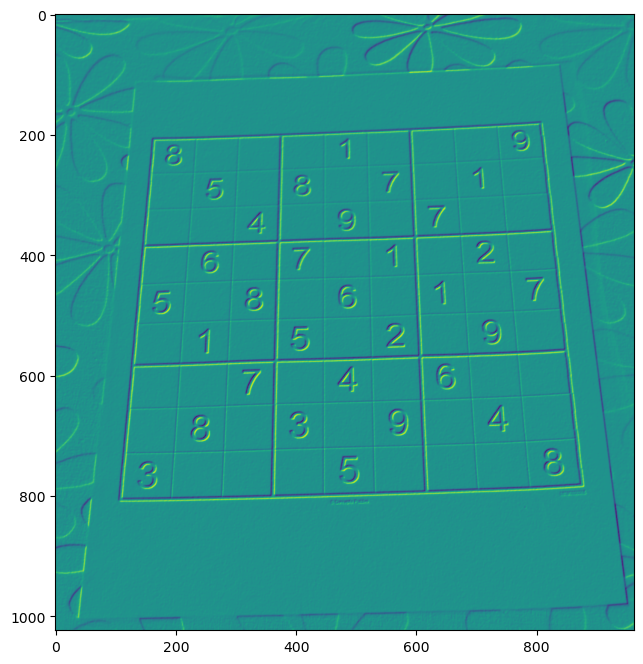

In [376]:
imdisplay(blended_sobel_derivatives)

In [377]:
#The weighted sum of both derivatives shows a better results.You can try other ideas such as thresholding, morphological operators 
# to determines edges

5. Corner detection

In [378]:
#There is a difference between a corner and and edge. While a sudden change of brightness or color in an image signifies an edge,
# a junction of two edges is interpreted as a corner
#Let's take an example of Harris corner detection algorithm

In [380]:
#For the purpose of corner detection, let's use chessboard and real_chessboard
chess_img = cv2.imread("chessboard.png")
chess_img = cv2.cvtColor(chess_img,cv2.COLOR_BGR2RGB)

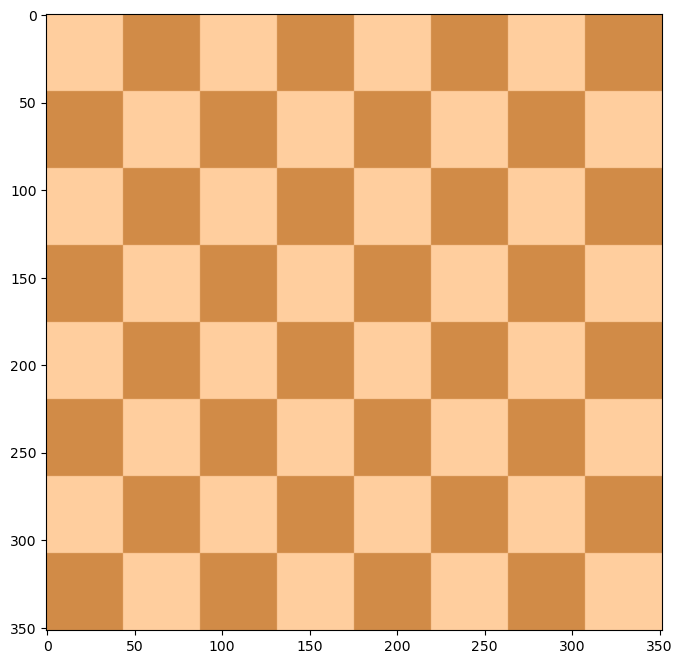

In [381]:
imdisplay(chess_img)

In [388]:
real_chessboard_img = cv2.imread("real_chessboard.jpg")
real_chessboard_img = cv2.cvtColor(real_chess_img,cv2.COLOR_BGR2RGB)

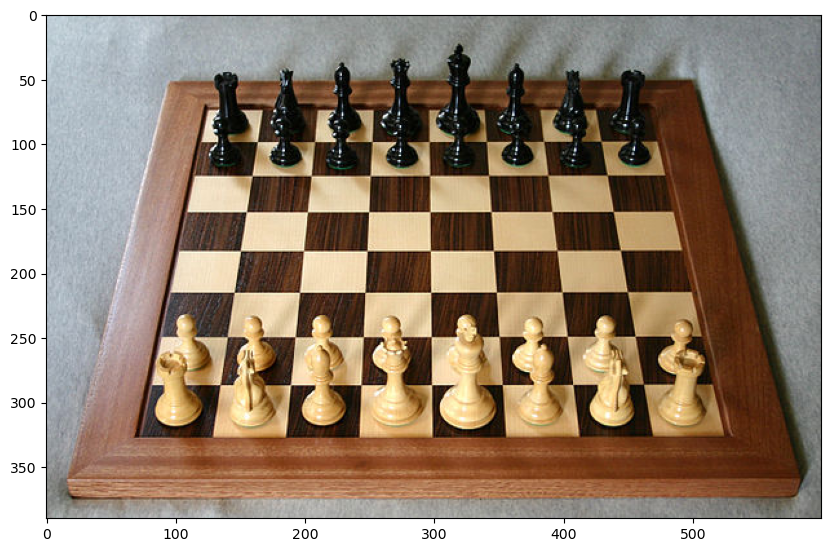

In [389]:
imdisplay(real_chess_img)

In [397]:
real_chessboard_gray = cv2.cvtColor(real_chessboard_img,cv2.COLOR_BGR2GRAY)


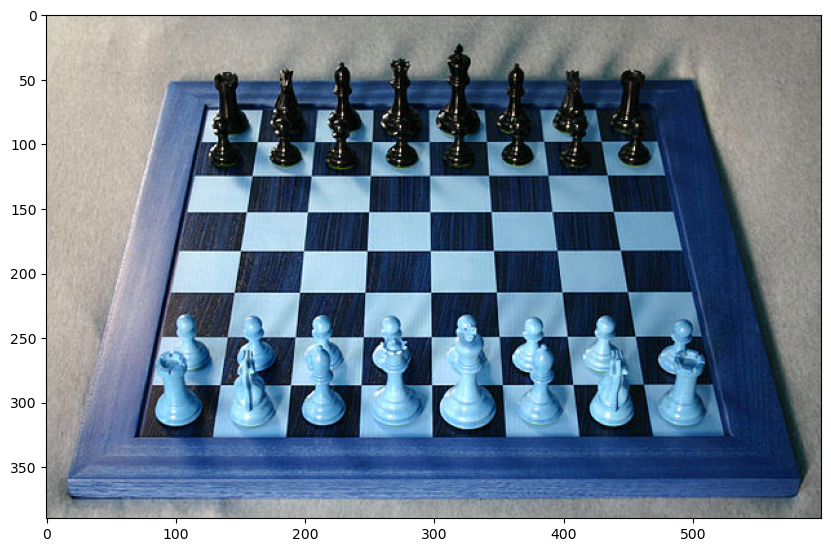

In [399]:
imdisplay(real_chessboard_img)

In [419]:
#The real_chessboard_gray values are integers, convert them to float for Harris corner detection 
#to work well
chess_img_gray = np.float32(chess_img)
chess_img_gray_float = np.float32(chess_img_gray)

In [420]:
Harris_corner = cv2.cornerHarris(src=chess_img_gray_float,blockSize=2,ksize=3,k=0.04)

In [421]:
chess_img[Harris_corner>0.01*Harris_corner.max()]=[0,255,0]
imdisplay(chess_img)

ValueError: NumPy boolean array indexing assignment cannot assign 3 input values to the 441 output values where the mask is true